# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv',nrows=50000)
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (50000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [5]:
y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)
project_data.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0


In [6]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,154.60,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,299.00,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,516.85,22
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,232.90,4
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,67.98,4


In [7]:
X=project_data
X.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,154.60,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,299.00,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,516.85,22
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,232.90,4
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,67.98,4


## 1.2 preprocessing of `project_subject_categories`

In [8]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [9]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.4 preprocessing of `project_grade_category`

In [10]:
catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for j in catogories:
    temp = ""
    j=j.replace(' ','_') 
    j = j.replace('-','To') 
    temp+=j 
    cat_list.append(temp)
    
project_data['project_grade_category'] = cat_list



## 1.5 Text preprocessing

In [11]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [12]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,price,quantity,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreKTo2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6To8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [13]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [14]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [15]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [16]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [17]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [18]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [19]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [20]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [00:54<00:00, 913.16it/s]


In [21]:
# after preprocesing
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

<h2><font color='red'> 1.6 Preprocessing of `project_title`</font></h2>

In [22]:
# Displaying first two datasets 
X.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,price,quantity,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreKTo2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6To8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [23]:
# printing some random project titles.
print(X['project_title'].values[0])
print("="*50)
print(X['project_title'].values[150])
print("="*50)
print(X['project_title'].values[1000])
print("="*50)

Educational Support for English Learners at Home
More Movement with Hokki Stools
Sailing Into a Super 4th Grade Year


In [24]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)   #re represents regular expression
    phrase = re.sub(r"can\'t", "can not", phrase)   #sub represents substute

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [25]:
sent = decontracted(X['project_title'].values[20000])
print(sent)
print("="*50)

We Need To Move It While We Input It!


In [26]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

We Need To Move It While We Input It!


In [27]:
#remove spacial character and converting to lowercase: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent).lower()
print(sent)

we need to move it while we input it 


In [28]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [29]:
sent = ' '.join(e for e in sent.split() if e not in stopwords)
print(sent)

need move input


In [30]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_project_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(X['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent).lower()
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_project_titles.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:02<00:00, 22762.25it/s]


In [31]:
# after preprocesing
preprocessed_project_titles[20000]

'need move input'

# 2.  Splitting Data
### Splitting data into Train and cross validation(or test): Stratified Sampling

In [32]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [33]:
X_train=X_train.reset_index()
X_test=X_test.reset_index()
X_cv=X_cv.reset_index()

## 2.1 Preparing data for models

In [34]:
X.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

## 2.2 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [37]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vectorizer.transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 51) (22445,)
(11055, 51) (11055,)
(16500, 51) (16500,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


In [38]:
X_train['teacher_prefix'].fillna(value='Teacher',inplace=True)
X_cv['teacher_prefix'].fillna(value='Teacher',inplace=True)
X_test['teacher_prefix'].fillna(value='Teacher',inplace=True)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 5) (22445,)
(11055, 5) (11055,)
(16500, 5) (16500,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


In [39]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 4) (22445,)
(11055, 4) (11055,)
(16500, 4) (16500,)
['grades_3to5', 'grades_6to8', 'grades_9to12', 'grades_prekto2']


In [40]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 4) (22445,)
(11055, 4) (11055,)
(16500, 4) (16500,)
['grades_3to5', 'grades_6to8', 'grades_9to12', 'grades_prekto2']


In [41]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_category_ohe = vectorizer.transform(X_train['clean_categories'].values)
X_cv_category_ohe = vectorizer.transform(X_cv['clean_categories'].values)
X_test_category_ohe = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_category_ohe.shape, y_train.shape)
print(X_cv_category_ohe.shape, y_cv.shape)
print(X_test_category_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 9) (22445,)
(11055, 9) (11055,)
(16500, 9) (16500,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


In [42]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_subcategory_ohe = vectorizer.transform(X_train['clean_subcategories'].values)
X_cv_subcategory_ohe = vectorizer.transform(X_cv['clean_subcategories'].values)
X_test_subcategory_ohe = vectorizer.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_subcategory_ohe.shape, y_train.shape)
print(X_cv_subcategory_ohe.shape, y_cv.shape)
print(X_test_subcategory_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 30) (22445,)
(11055, 30) (11055,)
(16500, 30) (16500,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


## 2.3 Vectorizing Text data

### 2.3.1 Bag of words

 #### Vectorizing Essay Text

In [43]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


from sklearn.feature_extraction.text import CountVectorizer
vectorizer_essay = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_essay.fit(X_train['essay'].values) # fit has to happen only on train data

featurenames=vectorizer_essay.get_feature_names()
# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vectorizer_essay.transform(X_train['essay'].values)
X_cv_essay_bow = vectorizer_essay.transform(X_cv['essay'].values)
X_test_essay_bow = vectorizer_essay.transform(X_test['essay'].values)

print("After vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_cv_essay_bow.shape, y_cv.shape)
print(X_test_essay_bow.shape, y_test.shape)
print("="*100)

(22445, 20) (22445,)
(11055, 20) (11055,)
(16500, 20) (16500,)
After vectorizations
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


 #### Vectorizing Title Text

In [44]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)

from sklearn.feature_extraction.text import CountVectorizer
vectorizer_title = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_title.fit(X_train['project_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_title_bow = vectorizer_title.transform(X_train['project_title'].values)
X_cv_title_bow = vectorizer_title.transform(X_cv['project_title'].values)
X_test_title_bow = vectorizer_title.transform(X_test['project_title'].values)

print("After vectorizations")
print(X_train_title_bow.shape, y_train.shape)
print(X_cv_title_bow.shape, y_cv.shape)
print(X_test_title_bow.shape, y_test.shape)
print("="*100)

(22445, 20) (22445,)
(11055, 20) (11055,)
(16500, 20) (16500,)
After vectorizations
(22445, 2692) (22445,)
(11055, 2692) (11055,)
(16500, 2692) (16500,)


### 2.3.2 TFIDF vectorizer

 #### Vectorizing Essay Text

In [45]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_essay = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_essay.fit(X_train['essay'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
featurenames=vectorizer_essay.get_feature_names()
X_train_essay_tfidf = vectorizer_essay.transform(X_train['essay'].values)
X_cv_essay_tfidf = vectorizer_essay.transform(X_cv['essay'].values)
X_test_essay_tfidf = vectorizer_essay.transform(X_test['essay'].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*100)


(22445, 20) (22445,)
(11055, 20) (11055,)
(16500, 20) (16500,)
After vectorizations
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


 #### Vectorizing Title Text

In [46]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_title = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer_title.fit(X_train['project_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_title_tfidf = vectorizer_title.transform(X_train['project_title'].values)
X_cv_title_tfidf = vectorizer_title.transform(X_cv['project_title'].values)
X_test_title_tfidf = vectorizer_title.transform(X_test['project_title'].values)

print("After vectorizations")
print(X_train_title_tfidf.shape, y_train.shape)
print(X_cv_title_tfidf.shape, y_cv.shape)
print(X_test_title_tfidf.shape, y_test.shape)
print("="*100)


(22445, 20) (22445,)
(11055, 20) (11055,)
(16500, 20) (16500,)
After vectorizations
(22445, 2692) (22445,)
(11055, 2692) (11055,)
(16500, 2692) (16500,)


### 2.3.3 AVG W2V for Essays

####  AVG W2V for Essays

In [49]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors.txt', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

##### Using Train Data

In [50]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_essays_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_essays_tr.append(vector)

print(len(avg_w2v_vectors_for_essays_tr))
print(len(avg_w2v_vectors_for_essays_tr[0]))

avg_w2v_vectors_for_essays_tr=csr_matrix(avg_w2v_vectors_for_essays_tr)

100%|██████████████████████████████████████████████████████████████████████████| 22445/22445 [00:14<00:00, 1554.77it/s]


22445
300


##### Using Test Data

In [51]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_essays_te = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_essays_te.append(vector)

print(len(avg_w2v_vectors_for_essays_te))
print(len(avg_w2v_vectors_for_essays_te[0]))

avg_w2v_vectors_for_essays_te=csr_matrix(avg_w2v_vectors_for_essays_te)

100%|██████████████████████████████████████████████████████████████████████████| 16500/16500 [00:10<00:00, 1614.01it/s]


16500
300


##### Using CV Data

In [52]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_essays_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_essays_cv.append(vector)

print(len(avg_w2v_vectors_for_essays_cv))
print(len(avg_w2v_vectors_for_essays_cv[0]))

avg_w2v_vectors_for_essays_cv=csr_matrix(avg_w2v_vectors_for_essays_cv)

100%|██████████████████████████████████████████████████████████████████████████| 11055/11055 [00:06<00:00, 1593.48it/s]


11055
300


#### AVG W2V for Titles

##### Using Train Data

In [53]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_titles_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_titles_tr.append(vector)

print(len(avg_w2v_vectors_for_titles_tr))
print(len(avg_w2v_vectors_for_titles_tr[0]))

avg_w2v_vectors_for_titles_tr=csr_matrix(avg_w2v_vectors_for_titles_tr)

100%|████████████████████████████████████████████████████████████████████████| 22445/22445 [00:00<00:00, 100550.22it/s]


22445
300


##### Using Test Data

In [54]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_titles_te = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_titles_te.append(vector)

print(len(avg_w2v_vectors_for_titles_te))
print(len(avg_w2v_vectors_for_titles_te[0]))

avg_w2v_vectors_for_titles_te=csr_matrix(avg_w2v_vectors_for_titles_te)

100%|█████████████████████████████████████████████████████████████████████████| 16500/16500 [00:00<00:00, 93950.77it/s]


16500
300


##### Using CV Data

In [55]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
avg_w2v_vectors_for_titles_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_for_titles_cv.append(vector)

print(len(avg_w2v_vectors_for_titles_cv))
print(len(avg_w2v_vectors_for_titles_cv[0]))

avg_w2v_vectors_for_titles_cv=csr_matrix(avg_w2v_vectors_for_titles_cv)

100%|████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 120935.26it/s]


11055
300


### 2.3.4 Using Pretrained Models: TFIDF weighted W2V

#### TFIDF weighted W2V for Essays

##### Using Train Data

In [56]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [57]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
tfidf_w2v_vectors_for_essays_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_essays_tr.append(vector)

print(len(tfidf_w2v_vectors_for_essays_tr))
print(len(tfidf_w2v_vectors_for_essays_tr[0]))

tfidf_w2v_vectors_for_essays_tr=csr_matrix(tfidf_w2v_vectors_for_essays_tr)

100%|███████████████████████████████████████████████████████████████████████████| 22445/22445 [02:36<00:00, 143.27it/s]


22445
300


##### Using Test Data

In [58]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_for_essays_te = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_essays_te.append(vector)

print(len(tfidf_w2v_vectors_for_essays_te))
print(len(tfidf_w2v_vectors_for_essays_te[0]))

tfidf_w2v_vectors_for_essays_te=csr_matrix(tfidf_w2v_vectors_for_essays_te)

100%|███████████████████████████████████████████████████████████████████████████| 16500/16500 [01:54<00:00, 143.73it/s]


16500
300


##### Using CV Data

In [59]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_for_essays_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_essays_cv.append(vector)

print(len(tfidf_w2v_vectors_for_essays_cv))
print(len(tfidf_w2v_vectors_for_essays_cv[0]))

tfidf_w2v_vectors_for_essays_cv=csr_matrix(tfidf_w2v_vectors_for_essays_cv)

100%|███████████████████████████████████████████████████████████████████████████| 11055/11055 [01:17<00:00, 142.77it/s]


11055
300


#### TFIDF weighted W2V for Titles

##### Using Train Data

In [60]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['project_title'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [61]:
# average Word2Vec
# compute average word2vec for each review.
from scipy.sparse import csr_matrix
tfidf_w2v_vectors_for_titles_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_titles_tr.append(vector)

print(len(tfidf_w2v_vectors_for_titles_tr))
print(len(tfidf_w2v_vectors_for_titles_tr[0]))

tfidf_w2v_vectors_for_titles_tr=csr_matrix(tfidf_w2v_vectors_for_titles_tr)

100%|█████████████████████████████████████████████████████████████████████████| 22445/22445 [00:00<00:00, 60612.70it/s]


22445
300


##### Using Test Data

In [62]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_for_titles_te = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_titles_te.append(vector)

print(len(tfidf_w2v_vectors_for_titles_te))
print(len(tfidf_w2v_vectors_for_titles_te[0]))

tfidf_w2v_vectors_for_titles_te=csr_matrix(tfidf_w2v_vectors_for_titles_te)

100%|█████████████████████████████████████████████████████████████████████████| 16500/16500 [00:00<00:00, 61774.04it/s]


16500
300


##### Using CV Data

In [63]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_for_titles_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['project_title'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_for_titles_cv.append(vector)

print(len(tfidf_w2v_vectors_for_titles_cv))
print(len(tfidf_w2v_vectors_for_titles_cv[0]))

tfidf_w2v_vectors_for_titles_cv=csr_matrix(tfidf_w2v_vectors_for_titles_cv)

100%|█████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 70062.66it/s]


11055
300


### 2.4 Vectorizing Numerical features

In [64]:

X_train_price_norm = (X_train['price'].values.reshape(-1,1))
X_cv_price_norm = (X_cv['price'].values.reshape(-1,1))
X_test_price_norm = (X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [65]:

X_train_teacher_norm = (X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_cv_teacher_norm = (X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_teacher_norm = (X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_teacher_norm.shape, y_train.shape)
print(X_cv_teacher_norm.shape, y_cv.shape)
print(X_test_teacher_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [66]:

X_train_quantity_norm = (X_train['quantity'].values.reshape(-1,1))
X_cv_quantity_norm = (X_cv['quantity'].values.reshape(-1,1))
X_test_quantity_norm = (X_test['quantity'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_quantity_norm.shape, y_train.shape)
print(X_cv_quantity_norm.shape, y_cv.shape)
print(X_test_quantity_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


### 2.5 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [67]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_essay_bow,X_train_title_bow, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_teacher_norm,X_train_quantity_norm)).tocsr()
X_cr = hstack((X_cv_essay_bow,X_cv_title_bow, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_teacher_norm,X_cv_quantity_norm)).tocsr()
X_te = hstack((X_test_essay_bow, X_test_title_bow,X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_quantity_norm,X_test_teacher_norm,X_test_quantity_norm)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 7794) (22445,)
(11055, 7794) (11055,)
(16500, 7794) (16500,)


In [68]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X2_tr = hstack((X_train_essay_tfidf,X_train_title_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_teacher_norm,X_train_quantity_norm)).tocsr()
X2_cr = hstack((X_cv_essay_tfidf,X_cv_title_tfidf, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_teacher_norm,X_cv_quantity_norm)).tocsr()
X2_te = hstack((X_test_essay_tfidf, X_test_title_tfidf,X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_quantity_norm,X_test_teacher_norm,X_test_quantity_norm)).tocsr()

print("Final Data matrix")
print(X2_tr.shape, y_train.shape)
print(X2_cr.shape, y_cv.shape)
print(X2_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 7794) (22445,)
(11055, 7794) (11055,)
(16500, 7794) (16500,)


In [69]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X3_tr = hstack((avg_w2v_vectors_for_essays_tr,avg_w2v_vectors_for_titles_tr, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_teacher_norm,X_train_quantity_norm)).tocsr()
X3_cr = hstack((avg_w2v_vectors_for_essays_cv,avg_w2v_vectors_for_titles_cv, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_teacher_norm,X_cv_quantity_norm)).tocsr()
X3_te = hstack((avg_w2v_vectors_for_essays_te,avg_w2v_vectors_for_titles_te,X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_quantity_norm,X_test_teacher_norm,X_test_quantity_norm)).tocsr()

print("Final Data matrix")
print(X3_tr.shape, y_train.shape)
print(X3_cr.shape, y_cv.shape)
print(X3_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 702) (22445,)
(11055, 702) (11055,)
(16500, 702) (16500,)


In [70]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X4_tr = hstack((tfidf_w2v_vectors_for_essays_tr,tfidf_w2v_vectors_for_titles_tr, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_teacher_norm,X_train_quantity_norm)).tocsr()
X4_cr = hstack((tfidf_w2v_vectors_for_essays_cv,tfidf_w2v_vectors_for_titles_cv, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_teacher_norm,X_cv_quantity_norm)).tocsr()
X4_te = hstack((tfidf_w2v_vectors_for_essays_te,tfidf_w2v_vectors_for_titles_te,X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_quantity_norm,X_test_teacher_norm,X_test_quantity_norm)).tocsr()

print("Final Data matrix")
print(X4_tr.shape, y_train.shape)
print(X4_cr.shape, y_cv.shape)
print(X4_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 702) (22445,)
(11055, 702) (11055,)
(16500, 702) (16500,)


<h1>2.6 Decision Tree </h1>

### 2.6.1 Applying Decision Trees on BOW,<font color='red'> SET 1</font>

In [98]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier(random_state=0,class_weight="balanced")
parameters = {'max_depth':[1, 5, 10, 50,100,500],'min_samples_split':[5,10,100,500]}
clf = GridSearchCV(dt, parameters, cv=2, scoring='roc_auc')
clf.fit(X_tr,y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [35]:
clf.best_params_

{'max_depth': 10, 'min_samples_split': 3}


In [100]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

The best value of max depth obtained from the plot is 10 and minimum samples split features is 3.

In [71]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

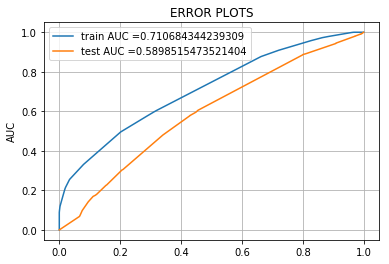

In [83]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(max_depth=10, min_samples_split=3,random_state=0,class_weight="balanced",splitter='random')
clf.fit(X_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = clf.predict_proba(X_tr)
preds = y_train_pred[:,1] #code copied from https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python to remove the error-bad input shape
y_test_pred = clf.predict_proba(X_te)
preds2=y_test_pred[:,1]


train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

* Train AUC is 0.7106
* Test AUC is 0.5898  represent the prediction level on the test dataset. In other words if a data point is provided the probabilty of classifying it correctly after the training has been done is 58.98 %.

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24956170044467443 for threshold 0.359


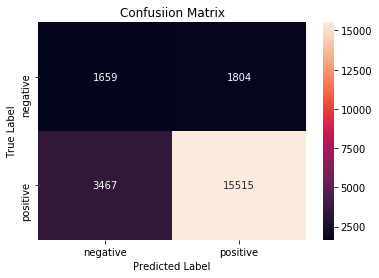

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.2499697629601198 for threshold 0.803


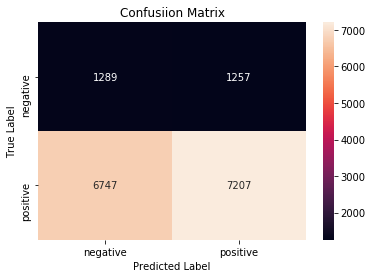

In [74]:
print("="*100)
from sklearn.metrics import confusion_matrix
import seaborn as sns
class_label = ["negative", "positive"]

# Reference: https://seaborn.pydata.org/generated/seaborn.heatmap.html
# https://stackoverflow.com/questions/37790429/seaborn-heatmap-using-pandas-dataframe

print("Train confusion matrix")
cm=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
df= pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Test confusion matrix")

cm=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))
df = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [58]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
from scipy.sparse import csr_matrix
FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X_te[i])==1):
        FP.append(X_test['essay'][i])
        
#converting array to string as word cloud accepts string as a parameter
string=''.join(str(e) for e in FP)

__Word Cloud of False Positive features__

(-0.5, 799.5, 799.5, -0.5)

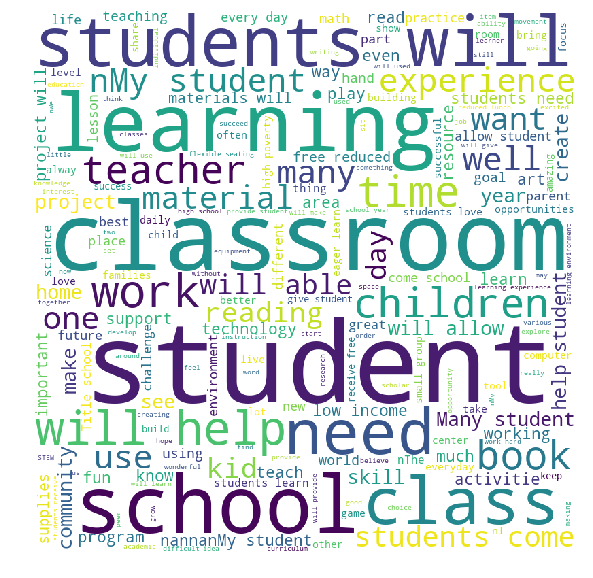

In [59]:
#Reference:https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=800,background_color='white',min_font_size=10).generate(string)
plt.figure(figsize=(10,10),facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")

In [60]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

__Box Plot of False positive features__

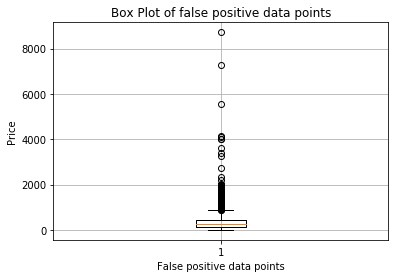

In [61]:
plt.boxplot([price_FP])
plt.title('Box Plot of false positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

The median value lies around 250. And it does not give clear interpretation of the false data points. 

In [62]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X_te[i])==1):
        teacher_FP.append(X_test_teacher_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

__PDF of False positive features__

C:\Users\dheer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: VisibleDeprecationWarning:

Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.



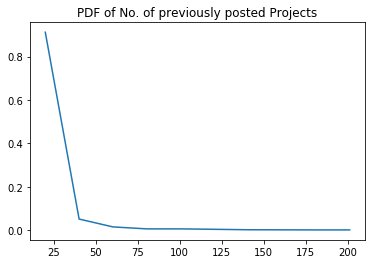

In [63]:
#Combined CDF and PDF with Classes 1 and 2
#Plot CDF and PDF of age with Class=1
counts, bin_edges = np.histogram(teacher_FP, bins=10, normed = True)
pdf = counts/(sum(counts))

plt.plot(bin_edges[1:],pdf,label='PDF')
plt.title("PDF of No. of previously posted Projects")
plt.show()

There is a high probability of no. of previously posted projects at lower values. As the value increases the probablity falls sharply (i.e after 40) and remains constant. 

#### 2.6.1. Graphviz visualization of Decision Tree on BOW,<font color='red'> SET 1</font>

In [66]:
# Refernce: https://pythonprogramminglanguage.com/decision-tree-visual-example/
from sklearn.feature_selection import SelectFromModel
dt =DecisionTreeClassifier(random_state=0,max_depth=3,min_samples_split=500)
dt.fit(X_train_essay_bow,y_train)

from sklearn import tree
import collections
import pydotplus

dot_data = tree.export_graphviz(dt,feature_names=featurenames,out_file=None,filled=True,rounded=True)
graph_data = pydotplus.graph_from_dot_data(dot_data)

colors = ('blue', 'orange')
edges = collections.defaultdict(list)

for edge in graph_data.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph_data.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph_data.write_png('bow_tree.png')

True

### 2.6.2 Applying Decision Trees on TFIDF,<font color='red'> SET 2</font>

In [64]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier(random_state=0,class_weight="balanced")
parameters = {'max_depth':[1, 5, 10, 50,100,500],'min_samples_split':[5,10,100,500]}
clf = GridSearchCV(dt, parameters, cv=2, scoring='roc_auc')
clf.fit(X2_tr,y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [65]:
clf.best_params_

{'max_depth': 10, 'min_samples_split': 500}

In [111]:

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'Train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

The best value of max depth obtained from the plot is 10 and minimum samples split features is 500.

In [69]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

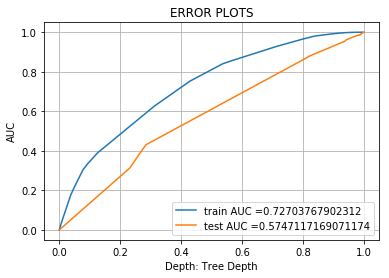

In [73]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

clf = DecisionTreeClassifier(max_depth=10, min_samples_split= 500,random_state=0,class_weight="balanced")
clf.fit(X2_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = clf.predict_proba(X2_tr)
preds = y_train_pred[:,1] #code copied from https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python to remove the error-bad input shape
y_test_pred = clf.predict_proba(X2_te)
preds2=y_test_pred[:,1]


train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

* Train AUC is 0.7270 
* Test AUC is 0.5747  represent the prediction level on the test dataset. In other words if a data point is provided the probabilty of classifying it correctly after the training has been done is 57.47 %.

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24953718485480225 for threshold 0.832


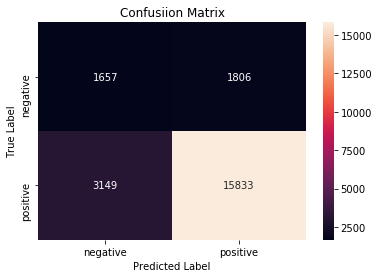

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24993196666026954 for threshold 0.952


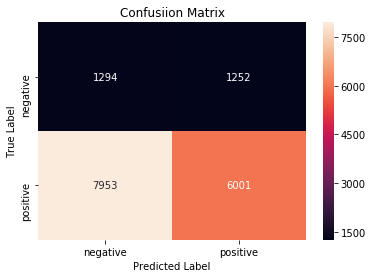

In [71]:
print("="*100)
from sklearn.metrics import confusion_matrix
import seaborn as sns
class_label = ["negative", "positive"]

# Reference: https://seaborn.pydata.org/generated/seaborn.heatmap.html
# https://stackoverflow.com/questions/37790429/seaborn-heatmap-using-pandas-dataframe

print("Train confusion matrix")
cm=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
df= pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Test confusion matrix")

cm=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))
df = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [73]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
from scipy.sparse import csr_matrix
FP=[]
X2_te=csr_matrix(X2_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X2_te[i])==1):
        FP.append(X_test['essay'][i])
        
        
#converting array to string as word cloud accepts string as a parameter
string=''.join(str(e) for e in FP)

__Word cloud of False positive features__

(-0.5, 799.5, 799.5, -0.5)

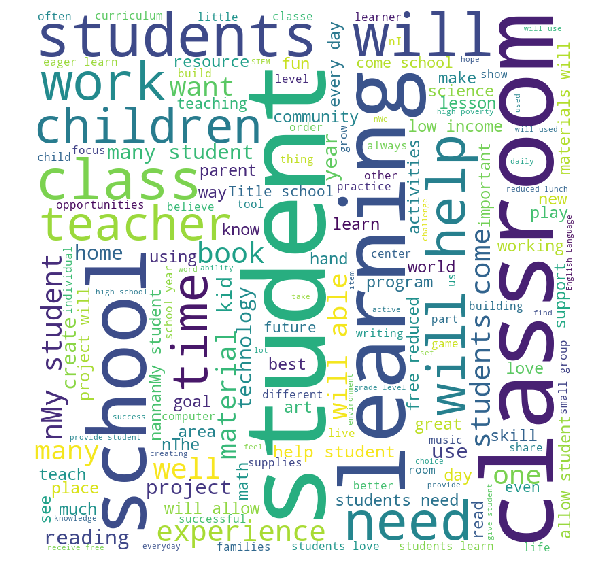

In [74]:
# Refernce: https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=800,background_color='white',min_font_size=10).generate(string)
plt.figure(figsize=(10,10),facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")

In [76]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
price_FP=[]
X2_te=csr_matrix(X2_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X2_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

__Box Plot of False positive features__

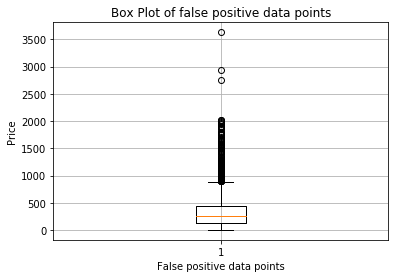

In [77]:
plt.boxplot([price_FP])
plt.title('Box Plot of false positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

The median value lies around 300. And it does not give clear interpretation of the false data points. 

In [78]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
teacher_FP=[]
X2_te=csr_matrix(X2_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X2_te[i])==1):
        teacher_FP.append(X_test_teacher_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

__PDF of False positive features__

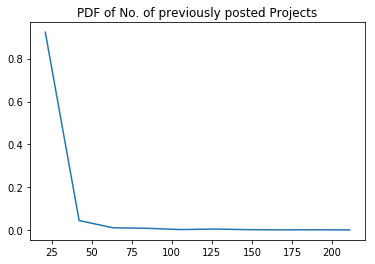

In [79]:
counts, bin_edges = np.histogram(teacher_FP, bins=10, density = True)
pdf = counts/(sum(counts))

plt.plot(bin_edges[1:],pdf,label='PDF')
plt.title("PDF of No. of previously posted Projects")

plt.show()

There is a high probability of no. of previously posted projects at lower values. As the value increases the probablity falls sharply (i.e after 40) and remains constant. 

#### 2.6.1 Graphviz visualization of Decision Tree on TFIDF,<font color='red'> SET 2</font>

In [80]:
# Refernce: https://pythonprogramminglanguage.com/decision-tree-visual-example/
from sklearn.feature_selection import SelectFromModel
dt =DecisionTreeClassifier(random_state=0,max_depth=3,min_samples_split=500)
dt.fit(X_train_essay_tfidf,y_train)

from sklearn import tree
import collections
import pydotplus

dot_data = tree.export_graphviz(dt,feature_names=featurenames,out_file=None,filled=True,rounded=True)
graph_data = pydotplus.graph_from_dot_data(dot_data)

colors = ('blue', 'orange')
edges = collections.defaultdict(list)

for edge in graph_data.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph_data.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph_data.write_png('tfidf_tree.png')

True

### 2.6.3 Applying Decision Trees on AVG W2V,<font color='red'> SET 3</font>

In [76]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier(random_state=0,class_weight="balanced")
parameters = {'max_depth':[1, 5, 10, 50,100,500],'min_samples_split':[5,10,100,500]}
clf = GridSearchCV(dt, parameters, cv=2, scoring='roc_auc')
clf.fit(X3_tr,y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [38]:
clf.best_params_

{'max_depth': 5, 'min_samples_split': 5}


In [78]:

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'Train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

The best value of max depth obtained from the plot is 5 and minimum samples split features is 5.

In [79]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

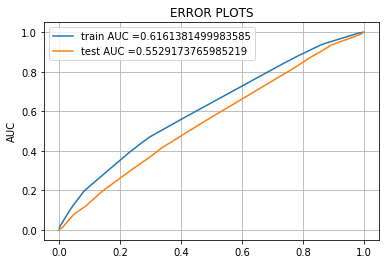

In [82]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

clf = DecisionTreeClassifier(max_depth=5, min_samples_split= 5,random_state=0,class_weight="balanced",splitter='random')
clf.fit(X3_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = clf.predict_proba(X3_tr)
preds = y_train_pred[:,1] #code copied from https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python to remove the error-bad input shape
y_test_pred = clf.predict_proba(X3_te)
preds2=y_test_pred[:,1]


train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

* Train AUC is 0.6161 
* Test AUC is 0.5529  represent the prediction level on the test dataset. In other words if a data point is provided the probabilty of classifying it correctly after the training has been done is 55.29%.

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999831142620782 for threshold 0.833


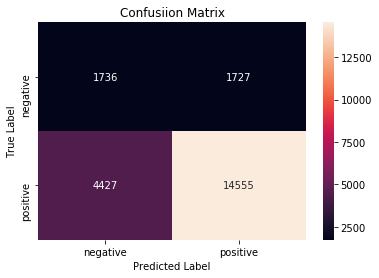

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.2489372297564561 for threshold 0.948


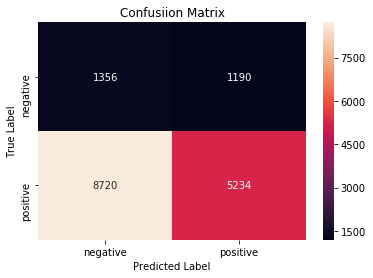

In [92]:
print("="*100)
from sklearn.metrics import confusion_matrix
import seaborn as sns
class_label = ["negative", "positive"]

# Reference: https://seaborn.pydata.org/generated/seaborn.heatmap.html
# https://stackoverflow.com/questions/37790429/seaborn-heatmap-using-pandas-dataframe

print("Train confusion matrix")
cm=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
df= pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Test confusion matrix")

cm=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))
df = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [93]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
from scipy.sparse import csr_matrix
FP=[]
X3_te=csr_matrix(X3_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X3_te[i])==1):
        FP.append(X_test['essay'][i])
        
#converting array to string as word cloud accepts string as a parameter 
string=''.join(str(e) for e in FP)

__Word Cloud of False positive features__

(-0.5, 799.5, 799.5, -0.5)

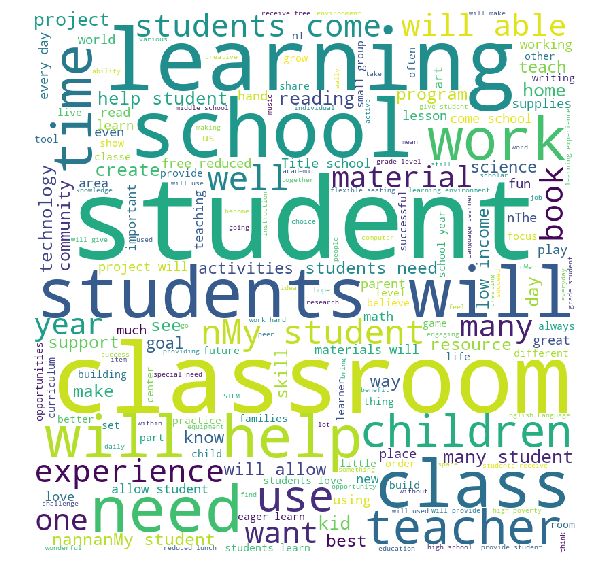

In [94]:
# Reference: https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=800,background_color='white',min_font_size=10).generate(string)
plt.figure(figsize=(10,10),facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")

In [95]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
price_FP=[]
X3_te=csr_matrix(X3_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X3_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

__Box Plot of False positive features__

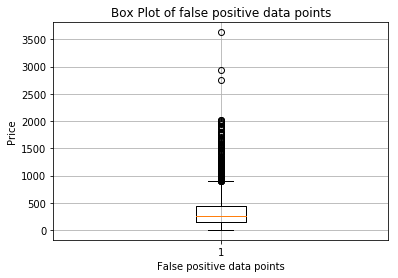

In [96]:
plt.boxplot([price_FP])
plt.title('Box Plot of false positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

The median value lies around 250. And it does not give clear interpretation of the false data points. 

In [97]:
#Reference:https://stackoverflow.com/questions/36184432/is-it-possible-to-retrieve-false-positives-false-negatives-identified-by-a-conf
teacher_FP=[]
X3_te=csr_matrix(X3_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X3_te[i])==1):
        teacher_FP.append(X_test_teacher_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

__PDF of False positive features__

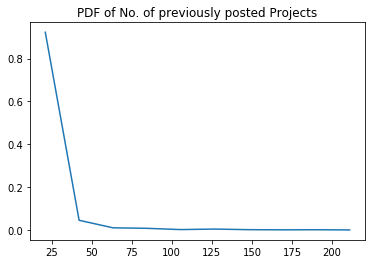

In [98]:
counts, bin_edges = np.histogram(teacher_FP, bins=10, density = True)
pdf = counts/(sum(counts))

plt.plot(bin_edges[1:],pdf,label='PDF')
plt.title("PDF of No. of previously posted Projects")

plt.show()

There is a high probability of no. of previously posted projects at lower values. As the value increases the probablity falls sharply (i.e after 40) and remains constant. 

### 2.6.4 Applying Decision Trees on TFIDF W2V,<font color='red'> SET 4</font>

In [56]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier(random_state=0,class_weight="balanced")
parameters = {'max_depth':[1, 5, 10, 50,100,500],'min_samples_split':[5,10,100,500]}
clf = GridSearchCV(dt, parameters, cv=2, scoring='roc_auc')
clf.fit(X4_tr,y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [57]:
clf.best_params_

{'max_depth': 5, 'min_samples_split': 500}

In [58]:

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'Train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

The best value of max depth obtained from the plot is 5 and minimum samples split features is 500.

In [102]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

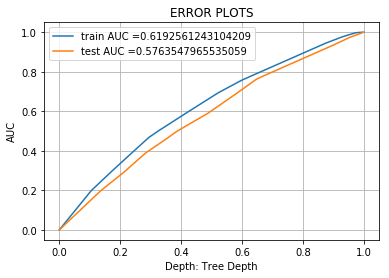

In [72]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

clf = DecisionTreeClassifier(max_depth=5, min_samples_split= 500,random_state=0,class_weight="balanced")
clf.fit(X4_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = clf.predict_proba(X4_tr)
preds = y_train_pred[:,1] #code copied from https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python to remove the error-bad input shape
y_test_pred = clf.predict_proba(X4_te)
preds2=y_test_pred[:,1]


train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

* Train AUC is 0.6192 
* Test AUC is 0.5763  represent the prediction level on the test dataset. In other words if a data point is provided the probabilty of classifying it correctly after the training has been done is 57.63 %.

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24553113734242166 for threshold 0.807


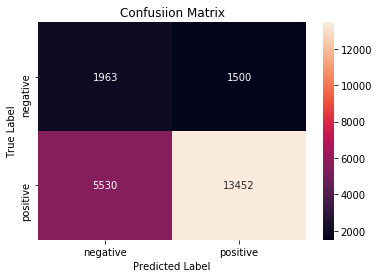

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24553113734242166 for threshold 0.807


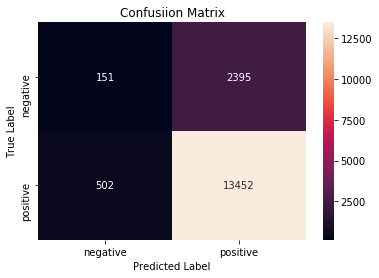

In [104]:
print("="*100)
from sklearn.metrics import confusion_matrix
import seaborn as sns
class_label = ["negative", "positive"]

# Reference: https://seaborn.pydata.org/generated/seaborn.heatmap.html
# https://stackoverflow.com/questions/37790429/seaborn-heatmap-using-pandas-dataframe

print("Train confusion matrix")
prediction_y_train=predict(preds, tr_thresholds, train_fpr, train_fpr)
cm=confusion_matrix(y_train, prediction_y_train)
df= pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Test confusion matrix")
prediction_y_test=predict(preds2, tr_thresholds, train_fpr, train_fpr)
cm=confusion_matrix(y_test, prediction_y_test)
df = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [88]:
from scipy.sparse import csr_matrix
FP=[]
X4_te=csr_matrix(X4_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X4_te[i])==1):
        FP.append(X_test['essay'][i])
        
#converting array to string as word cloud accepts string as a parameter
string=''.join(str(e) for e in FP)

__Word Cloud of False positive features__

(-0.5, 799.5, 799.5, -0.5)

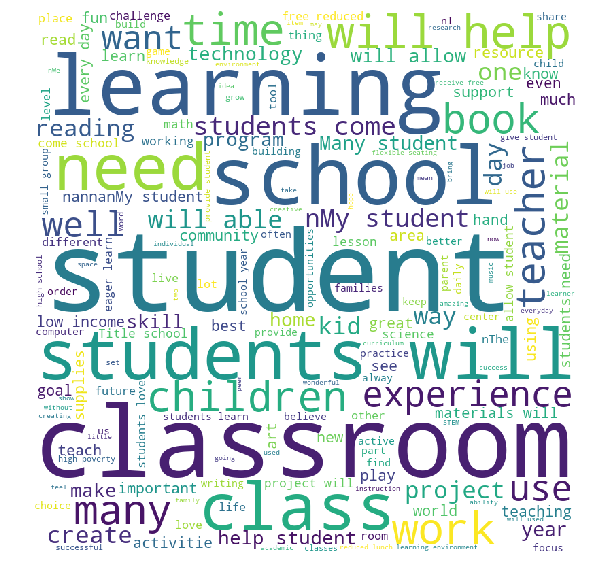

In [89]:
# Reference: https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=800,background_color='white',min_font_size=10).generate(string)
plt.figure(figsize=(10,10),facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")

In [90]:
price_FP=[]
X4_te=csr_matrix(X4_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X4_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

__Box Plot of False positive features__

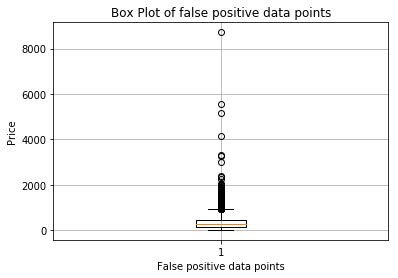

In [92]:
plt.boxplot([price_FP])
plt.title('Box Plot of false positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

The median value lies around 200. And it does not give clear interpretation of the false data points. 

In [93]:
teacher_FP=[]
X4_te=csr_matrix(X4_te)
for i in range(16500):
    if(y_test[i]==0 and clf.predict(X4_te[i])==1):
        teacher_FP.append(X_test_teacher_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

__PDF of False positive features__

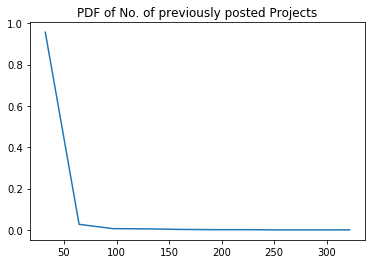

In [94]:
counts, bin_edges = np.histogram(teacher_FP, bins=10, density = True)
pdf = counts/(sum(counts))

plt.plot(bin_edges[1:],pdf,label='PDF')
plt.title("PDF of No. of previously posted Projects")

plt.show()

There is a high probability of no. of previously posted projects at lower values. As the value increases the probablity falls sharply (i.e after 60) and remains constant. 

<h2>2.7 [Task-2]Getting top 5k features using `feature_importances_`</h2>

In [77]:
#Reference:https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectFromModel.html
from sklearn.feature_selection import SelectFromModel
dt =DecisionTreeClassifier(random_state=0,max_depth=10,min_samples_split=500)
dt.fit(X2_tr,y_train)
top5k=SelectFromModel(estimator=dt,max_features=5000,threshold=-np.inf,prefit=True)
X2_tr_new =top5k.transform(X2_tr)
print(X2_tr_new.shape)
X2_cr_new =top5k.transform(X2_tr)
print(X2_cr_new.shape)
X2_te_new =top5k.transform(X2_te)
print(X2_te_new.shape)

(22445, 5000)
(22445, 5000)
(16500, 5000)


In [83]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier(random_state=0,class_weight="balanced")
parameters = {'max_depth':[1, 5, 10, 50,100,500],'min_samples_split':[5,10,100,500]}
clf = GridSearchCV(dt, parameters, cv=2, scoring='roc_auc')
clf.fit(X2_tr_new,y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [40]:
clf.best_params_

{'max_depth': 10, 'min_samples_split': 50}


In [85]:

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'Train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

The best value of max depth obtained from the plot is 10 and minimum samples split features is 50.

In [86]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

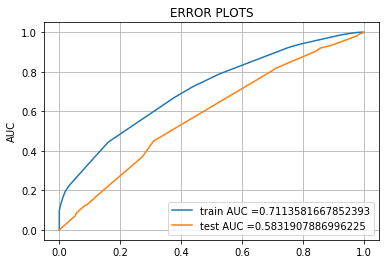

In [79]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

clf = DecisionTreeClassifier(max_depth=10, min_samples_split= 50,random_state=0,class_weight="balanced",splitter='random')
clf.fit(X2_tr_new, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = clf.predict_proba(X2_tr_new)
preds = y_train_pred[:,1] #code copied from https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python to remove the error-bad input shape
y_test_pred = clf.predict_proba(X2_te_new)
preds2=y_test_pred[:,1]


train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

* Train AUC is 0.7113. 
* Test AUC is 0.5831  represent the prediction level on the test dataset. In other words if a data point is provided the probabilty of classifying it correctly after the training has been done is 58.31 %.

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24981185952500295 for threshold 0.426


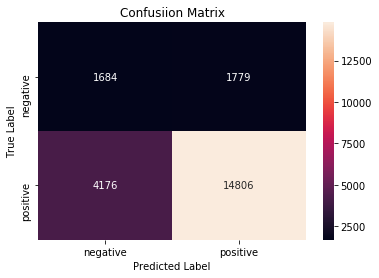

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.2147516335715066 for threshold 0.745


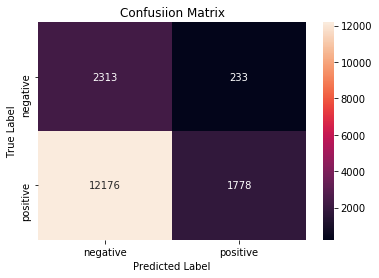

In [80]:
print("="*100)
from sklearn.metrics import confusion_matrix
import seaborn as sns
class_label = ["negative", "positive"]

# Reference: https://seaborn.pydata.org/generated/seaborn.heatmap.html
# https://stackoverflow.com/questions/37790429/seaborn-heatmap-using-pandas-dataframe

print("Train confusion matrix")
cm=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
df= pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Test confusion matrix")

cm=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))
df = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df, annot = True, fmt = "d")
plt.title("Confusiion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

<h1>3. Conclusion</h1>

In [41]:
# Please compare all your models using Prettytable library
# Reference: http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
x = PrettyTable()
x.field_names = ["Vectorizer",  "Max depth Hyper Parameter","Min features split Hyper Parameter","AUC"]
x.add_row(["BOW", 10 ,3,0.5898])
x.add_row(["TFIDF",  10,500,0.5747])
x.add_row(["AVG W2V", 5,5,0.5529])
x.add_row(["TFIDF W2V",  5,500,0.5763])
x.add_row(["Best 5k Features", 10,50,0.5831 ])
print(x)

+------------------+---------------------------+------------------------------------+--------+
|    Vectorizer    | Max depth Hyper Parameter | Min features split Hyper Parameter |  AUC   |
+------------------+---------------------------+------------------------------------+--------+
|       BOW        |             10            |                 3                  | 0.5898 |
|      TFIDF       |             10            |                500                 | 0.5747 |
|     AVG W2V      |             5             |                 5                  | 0.5529 |
|    TFIDF W2V     |             5             |                500                 | 0.5763 |
| Best 5k Features |             10            |                 50                 | 0.5831 |
+------------------+---------------------------+------------------------------------+--------+


* In Decision Tree the best value of Hyperparameter 'max_depth' lies between 5 to 10 and 'min_samples_split' lies between 3 -500 according to the observations made with BOW,TFIDF,AVG W2V,TFIDF W2V and best 5k feaqtures.
* Decision Tree with BOW,TFIDF,AVG W2V,TFIDF W2V have almost the same AUC and give almost same results .
* Decision Tree with best 5k features gives AUC of 0.5831 which is comparatively same as compared to other models.
* Thus from the observations made, Decision Tree is not a suitable classifying model for predicting the project is approved or not in this case as it gives prediction rate between 50-60%.
